<a href="https://colab.research.google.com/github/deepinder-saron/AER850_Project3/blob/main/AER850_Assignment3_50Epochs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mounted at /content/drive


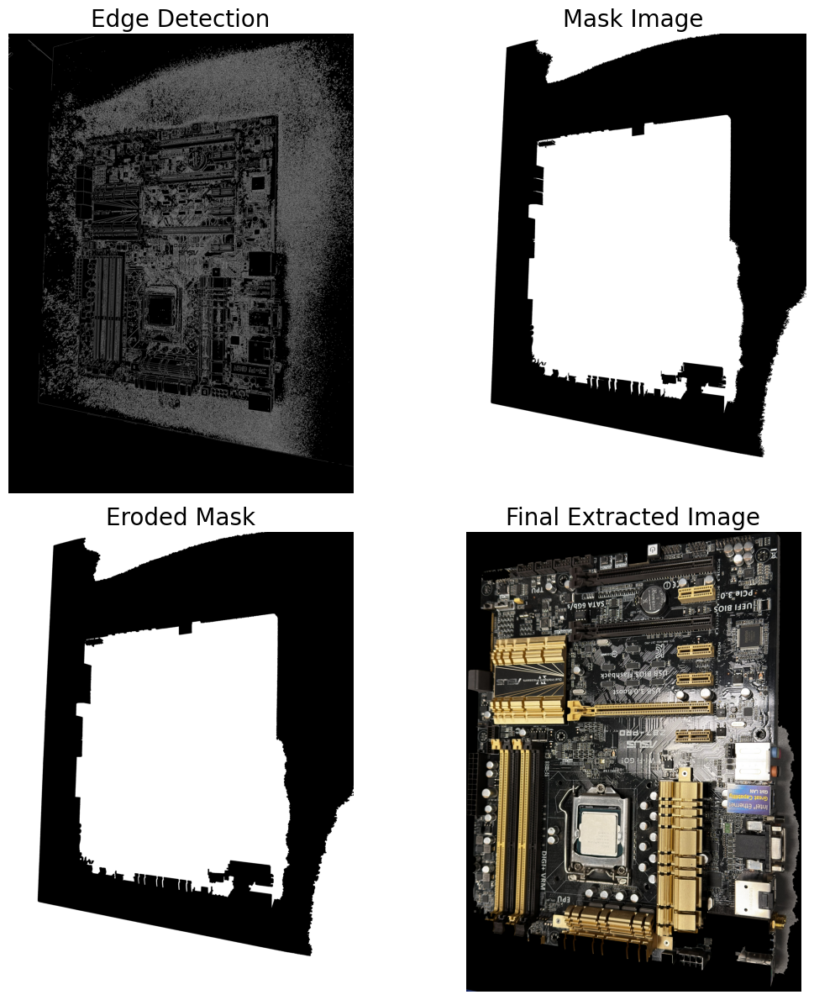

In [ ]:
from google.colab import drive
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

'''Step 1: Object Masking'''

# Mount Google Drive
!fusermount -u /content/drive
!rm -rf /content/drive
drive.mount('/content/drive')

# Define the path to image in Google Drive
image_path = '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/motherboard_image.JPEG'

# Load the image
image = cv2.imread(image_path, cv2.IMREAD_COLOR) # reading the image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # convert to grayscale since many algorithms such as edge detection and thresholdig work better on single-channel grayscale images

# Enhance contrast using histogram equalization
gray_eq = cv2.equalizeHist(gray) # enhancing the contrast using histogram equalization to better differentiate between the PCB and background

# Apply Gaussian blur
blurred = cv2.GaussianBlur(gray_eq, (5, 5), 0) # Smooths out the image and reduces noise since noise can lead to false edges during contour detection

# Thresholding to isolate the PCB
_, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
# converts the grayscale image into a binary image using Otsu's thresholding
# dynamically calculates the optimal threshold value based on the image's pixel distribution

# Morphological operations to clean up
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
cleaned_thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
# to remove small gaps within the hinary image using mrophological closing

# Find contours
contours, _ = cv2.findContours(cleaned_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# detects the edges or boundaries of objects in the binary image

# Filter contours based on area to isolate the PCB
filtered_contours = [c for c in contours if cv2.contourArea(c) > 50000]  # can adjust area threshold
# keeps only the largest contours based on area and smaller ones should be excluded

# Create a blank mask and draw the filtered contours
mask = np.zeros_like(gray)
cv2.drawContours(mask, filtered_contours, -1, (255), thickness = cv2.FILLED)
# creates a mask by filling in the filtered contours which isolates the motherboard from the rest of the image

# Erode the mask to tighten boundaries
kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
eroded_mask = cv2.erode(mask, kernel_erode, iterations = 1)
# shrinks the mask slightly to remove excess background around the motherboard which improves the final extraction quality

# Extract the PCB using the eroded mask
extracted_image = cv2.bitwise_and(image, image, mask = eroded_mask)
# using the mask to isolate the motherboard from the original image

# Automatically crop to the bounding box of the largest contour
x, y, w, h = cv2.boundingRect(max(filtered_contours, key = cv2.contourArea))
cropped_image = extracted_image[y:y+h, x:x+w]
# crop the image to tightly fit the motherboard so you don't see the rest of the background

# Display the results in a 2x2 grid
plt.figure(figsize = (12, 12))

# Edge detection visualization
plt.subplot(2, 2, 1)
edges = cv2.Canny(gray_eq, 50, 150)
plt.title("Edge Detection", fontsize = 20)
plt.imshow(edges, cmap = 'gray')
plt.axis('off')

# Mask image
plt.subplot(2, 2, 2)
plt.title("Mask Image", fontsize = 20)
plt.imshow(mask, cmap = 'gray')
plt.axis('off')

# Eroded Mask
plt.subplot(2, 2, 3)
plt.title("Eroded Mask", fontsize = 20)
plt.imshow(eroded_mask, cmap = 'gray')
plt.axis('off')

# Final extracted image
plt.subplot(2, 2, 4)
plt.title("Final Extracted Image", fontsize = 20)
plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
'''Installing Ultralytics for Google Colab'''

!pip install ultralytics


In [ ]:
'''Step 2: YOLOv8 Training'''

from ultralytics import YOLO

# Load YOLOv8 Nano model
model = YOLO('yolov8n.pt')

# Define hyperparameters
IMG_SIZE = 960
BATCH    = 8
EPOCHS   = 50
PATIENCE = 25

# Train the model
results = model.train(
    data = '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/data.yaml',
    imgsz=IMG_SIZE,
    batch=BATCH,
    epochs=EPOCHS,
    patience=PATIENCE,
    lr0 = 0.0005,
    lrf = 0.01,
    optimizer = 'AdamW',
    weight_decay = 0.0005,
    augment = True,
    amp = True,
    name = '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/motherboard_model_50epoch',
    device=0
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015,


image 1/1 /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/evaluation/ardmega.jpg: 864x960 1 Button, 11 Capacitors, 7 Connectors, 7 ICs, 5 Resistors, 41.6ms
Speed: 6.8ms preprocess, 41.6ms inference, 1.4ms postprocess per image at shape (1, 3, 864, 960)
Results saved to /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/prediction_run_50epochs/prediction_run

image 1/1 /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/evaluation/arduno.jpg: 672x960 9 Capacitors, 6 Connectors, 1 Electrolytic Capacitor, 3 ICs, 2 Resistors, 40.2ms
Speed: 4.3ms preprocess, 40.2ms inference, 1.3ms postprocess per image at shape (1, 3, 672, 960)
Results saved to /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/prediction_run_50epochs/prediction_run2

image 1/1 /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/evaluation/rasppi.jpg: 640x960 4 Capacit

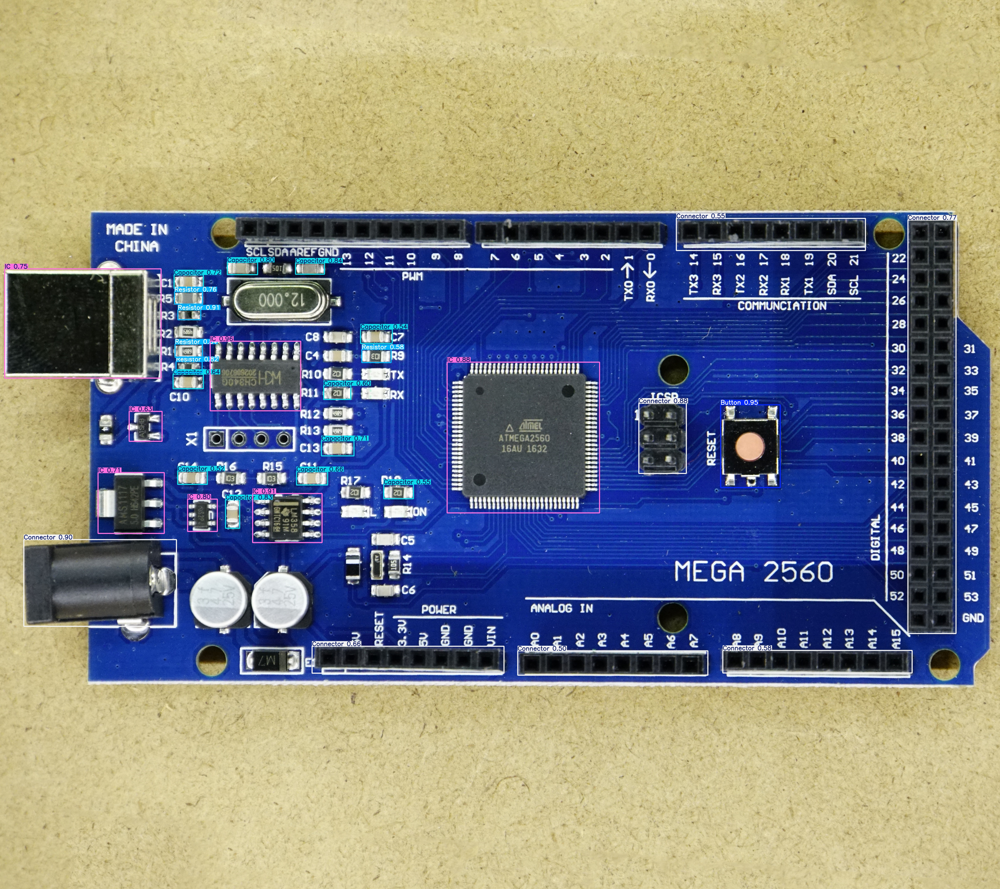

Displaying: /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/prediction_run_50epochs/prediction_run2/arduno.jpg


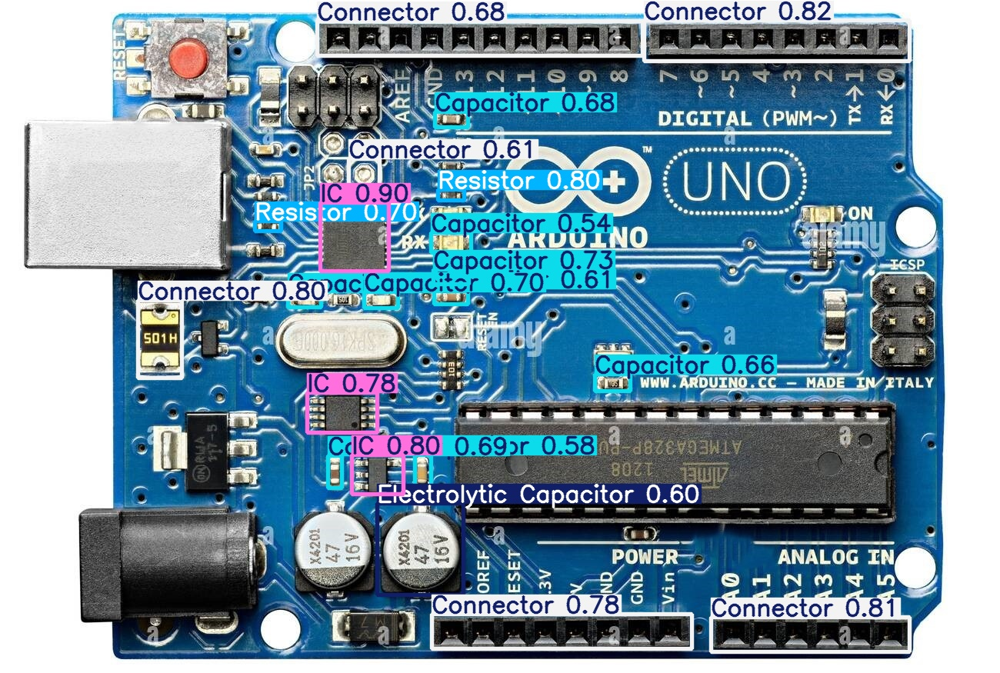

Displaying: /content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/prediction_run_50epochs/prediction_run3/rasppi.jpg


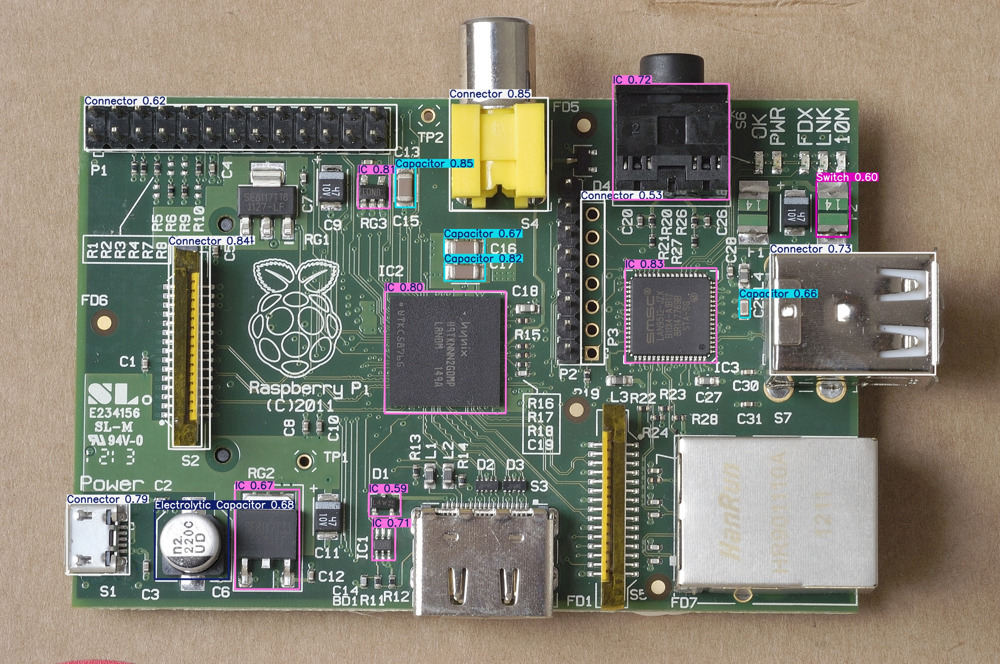

In [ ]:
'''Step 3: YOLOv8 Evaluation'''

from ultralytics import YOLO
from IPython.display import Image, display
import os

# Load your trained model
model = YOLO('/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/motherboard_model_50epoch/weights/best.pt')

# Paths to test images
image_paths = [
    '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/evaluation/ardmega.jpg',
    '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/evaluation/arduno.jpg',
    '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/data/data/evaluation/rasppi.jpg'
]

# Custom line width and text size
custom_args = {
    'line_width': 3,  # Thinner bounding box lines
    'font_size': 3  # Smaller font size for labels
}

# Define the base directory in Google Drive where you want to save the prediction results
drive_output_base = '/content/drive/My Drive/Colab Notebooks/AER850_Project3-main/Project 3 Data/prediction_run_50epochs'
os.makedirs(drive_output_base, exist_ok=True)

# Run inference, saving results to the specified Google Drive path
# Each call to predict with save=True and the same name/project will create a new 'prediction_runX' directory
results = [
    model.predict(source = img, save = True, conf = 0.5, project = drive_output_base, name = 'prediction_run', line_width = custom_args['line_width'], imgsz = 960)
    for img in image_paths
]

# Display all the output images saved by YOLOv8
print("Displaying detected images:")
for result_list in results:
    # model.predict returns a list of results (even if only one image), so we take the first element
    result = result_list[0]
    # result.path is the path to the original input image
    # result.save_dir is the directory where the output image is saved for this specific prediction
    output_image_filename = os.path.basename(result.path)
    output_image_path = os.path.join(result.save_dir, output_image_filename)

    if os.path.exists(output_image_path):
        print(f"Displaying: {output_image_path}")
        display(Image(filename = output_image_path))
    else:
        print(f"Warning: Output image not found at {output_image_path}")
